# Checking sparsity of gene expression in simulated samples

## Imports and setup

In [1]:
import logging
import warnings

import cloudpathlib
import dask.dataframe as dd
import helpers
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import scipy.stats
from statsmodels.stats.multitest import multipletests

In [2]:
warnings.filterwarnings("ignore", message="divide by zero")
warnings.filterwarnings("ignore", message="invalid value encountered in double_scalars")

In [3]:
from tqdm.autonotebook import tqdm

tqdm.pandas()

/tmp/ipykernel_19087/2614673571.py:1: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [4]:
logger = logging.getLogger(__name__)
logger.setLevel("DEBUG")

# helpers.logging.configure_logging()
udp_handler = logging.handlers.DatagramHandler("localhost", 12000)
udp_handler.setLevel("DEBUG")
stream_handler = logging.StreamHandler()
stream_handler.setFormatter(helpers.logging.formatter)
stream_handler.setLevel("INFO")

logging.getLogger().handlers = [udp_handler, stream_handler]

In [5]:
root = cloudpathlib.CloudPath(
    "gs://liulab/evaluating_cibersortx/identical_cohorts/2022-08-25_05:53:48/0/all_simulated_data"
)

In [6]:
!gsutil ls -lhR {root}

gs://liulab/evaluating_cibersortx/identical_cohorts/2022-08-25_05:53:48/0/all_simulated_data/:
 47.66 MiB  2022-08-25T05:53:57Z  gs://liulab/evaluating_cibersortx/identical_cohorts/2022-08-25_05:53:48/0/all_simulated_data/simulated_bulkrnaseq.parquet
243.86 MiB  2022-08-25T05:54:07Z  gs://liulab/evaluating_cibersortx/identical_cohorts/2022-08-25_05:53:48/0/all_simulated_data/simulated_cell_type_geps.parquet
TOTAL: 2 objects, 305674923 bytes (291.51 MiB)


## Gene expression sparsity in bulk samples

In [11]:
df_simulated_bulkrnaseq = pd.read_parquet(root / "simulated_bulkrnaseq.parquet")

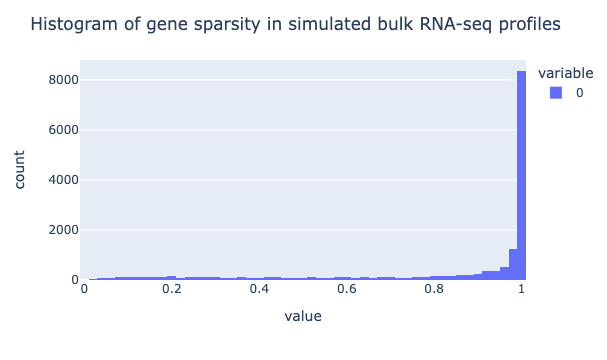

In [31]:
fig = px.histogram((df_simulated_bulkrnaseq != 0).mean(axis=1))
fig.update_layout(title="Histogram of gene sparsity in simulated bulk RNA-seq profiles")
fig

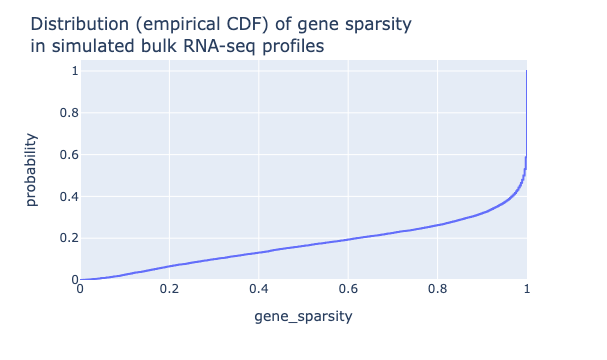

In [46]:
fig = px.ecdf(
    (df_simulated_bulkrnaseq != 0).mean(axis=1).to_frame("gene_sparsity").reset_index(),
    "gene_sparsity",
    hover_name="gene_symbol",
)
fig.update_layout(
    title="Distribution (empirical CDF) of gene sparsity <br>in simulated bulk RNA-seq profiles"
)
fig

## Gene expression sparsity in simulated cell type GEPs

In [7]:
df_simulated_cell_type_geps = pd.read_parquet(root / "simulated_cell_type_geps.parquet")

In [8]:
all_stuff = df_simulated_cell_type_geps.rename_axis(columns="cell_type").stack(level=-1)

In [9]:
all_stuff.groupby("cell_type").apply(
    lambda group: group.groupby("gene_symbol").apply(lambda g: (g != 0).mean())
)

cell_type  gene_symbol
B          A1BG           0.274457
           A2M            0.258152
           A2ML1          0.934783
           A4GALT         0.138587
           A4GNT          0.010870
                            ...   
T CD8      ZYG11A         1.000000
           ZYG11B         1.000000
           ZYX            0.923913
           ZZEF1          0.828804
           ZZZ3           0.529891
Length: 144567, dtype: float64

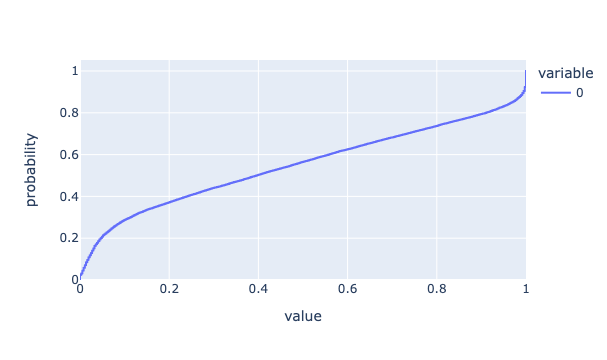

In [23]:
cell_type = "T CD8"
data = df_simulated_cell_type_geps["B"].unstack("sample_id")
# px.histogram((data != 0).mean(axis=1))
px.ecdf((data != 0).mean(axis=1).reset_index(), hover_name="gene_symbol")

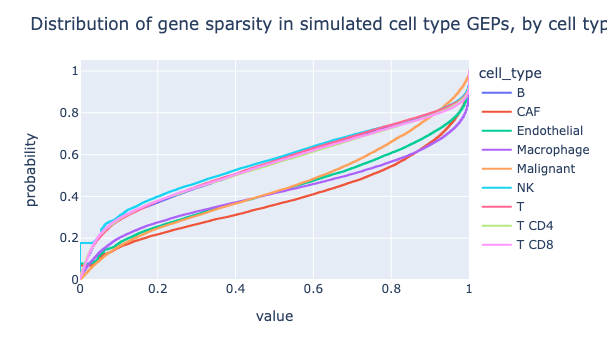

In [30]:
fig = px.ecdf(Out[9].rename("rate").unstack("cell_type"))
fig.update_layout(
    title="Distribution of gene sparsity in simulated cell type GEPs, by cell type"
)
fig